In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
from matplotlib import pyplot as plt

In [2]:
!nproc

4


In [3]:
!nvidia-smi

Thu May  2 07:57:07 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Loading Data

In [4]:
PATH_SYN = '/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thin/dataset/'
PATH = PATH_SYN

In [5]:
import os

os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

In [6]:
from tensorflow.keras.preprocessing.image import img_to_array, load_img

from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [7]:
import os
import numpy as np

def load_images(path, size=(256,256)):
    data_list = list()
    files = os.listdir(path)
    files.sort()
    
    for filename in files:
        pixels = load_img(os.path.join(path, filename), target_size=size)
        pixels = img_to_array(pixels)
        data_list.append(pixels)
        
    return np.asarray(data_list)

In [8]:
haze_inp = load_images(PATH + 'train/input/')
haze_tar = load_images(PATH + 'train/target/')

print(haze_inp.shape)
print(haze_tar.shape)

filename = 'haze_nn.npz'
np.savez_compressed(filename, haze_inp, haze_tar)
print('Saved dataset: ', filename)

(320, 256, 256, 3)
(320, 256, 256, 3)
Saved dataset:  haze_nn.npz


## Datset Visualization

Loaded:  (320, 256, 256, 3) (320, 256, 256, 3)


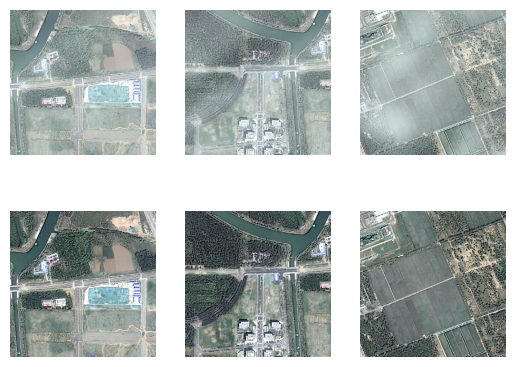

In [9]:
dataset = np.load('haze_nn.npz')
inp, target = dataset['arr_0'], dataset['arr_1']
print('Loaded: ', inp.shape, target.shape)
n_samples = 3


for i in range(n_samples):
    plt.subplot(2, n_samples, 1 + i)
    plt.axis('off')
    plt.imshow(inp[i].astype('uint8'))

for i in range(n_samples):
    plt.subplot(2, n_samples, 1 + n_samples + i)
    plt.axis('off')
    plt.imshow(target[i].astype('uint8'))
plt.show()

## Arch

In [10]:
from tensorflow import keras
from keras import Model, Input
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.layers import Conv2D, LeakyReLU, Activation, Concatenate, BatchNormalization, Conv2DTranspose, Dropout
from keras.utils.vis_utils import plot_model

In [11]:
image_shape = (256,256,3)

In [12]:
def discriminator(image_shape):
    init = RandomNormal(stddev=0.02, seed=123)
    
    in_src_image = Input(shape=image_shape)
    in_target_image = Input(shape=image_shape)
    
    merged = Concatenate()([in_src_image, in_target_image])
    
    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
    d = LeakyReLU(alpha=0.2)(d)
    
    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    
    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    
    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    
    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    
    d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
    patch_out = Activation('sigmoid')(d)
    
    model = Model([in_src_image, in_target_image], patch_out)
    
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
    return model

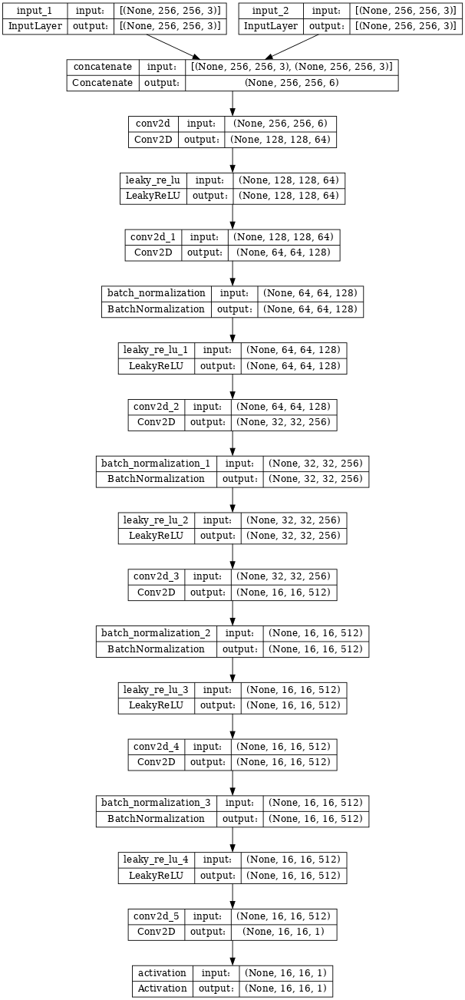

In [13]:
tf.keras.utils.plot_model(discriminator(image_shape), show_shapes=True, dpi=64)

In [14]:
def encoder_block(layer_in, n_filters, batchnorm=True):
    init = RandomNormal(stddev=0.02, seed=123)
    g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    if batchnorm:
        g = BatchNormalization()(g, training=True)
    g = LeakyReLU(alpha=0.2)(g)
    return g

def decoder_block(layer_in, skip_in, n_filters, dropout=True):
    init = RandomNormal(stddev=0.02, seed=123)
    g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    g = BatchNormalization()(g, training=True)
    
    if dropout:
        g = Dropout(0.5)(g, training=True)
    # skip connection
    g = Concatenate()([g, skip_in])
    g = Activation('relu')(g)
    return g

In [15]:
def generator(image_shape=(256,256,3)):
    init = RandomNormal(stddev=0.02, seed=123)

    in_image = Input(shape=image_shape)

    e1 = encoder_block(in_image, 64, batchnorm=False)
    e2 = encoder_block(e1, 128)
    e3 = encoder_block(e2, 256)
    e4 = encoder_block(e3, 512)
    e5 = encoder_block(e4, 512)
    e6 = encoder_block(e5, 512)
    e7 = encoder_block(e6, 512)
    # bottleneck
    b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
    b = Activation('relu')(b)
    
    d1 = decoder_block(b, e7, 512)
    d2 = decoder_block(d1, e6, 512)
    d3 = decoder_block(d2, e5, 512)
    d4 = decoder_block(d3, e4, 512, dropout=False)
    d5 = decoder_block(d4, e3, 256, dropout=False)
    d6 = decoder_block(d5, e2, 128, dropout=False)
    d7 = decoder_block(d6, e1, 64, dropout=False)
    
    g = Conv2DTranspose(3, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
    out_image = Activation('tanh')(g)
    model = Model(in_image, out_image)
    return model

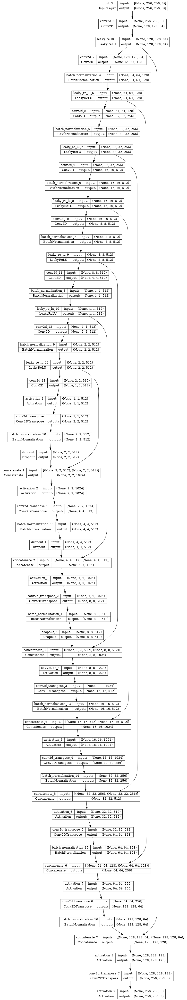

In [16]:
tf.keras.utils.plot_model(generator(image_shape), show_shapes=True, dpi=64)

## Pix2Pix

In [17]:
def pix2pix_gan(g_model, d_model, image_shape):
    for layer in d_model.layers:
        if not isinstance(layer, BatchNormalization):
            layer.trainble = False
    in_src = Input(shape=image_shape)
    gen_out = g_model(in_src)
    dis_out = d_model([in_src, gen_out])

    model = Model(in_src, [dis_out, gen_out])
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1,100])
    return model

## Helper functions

In [18]:
def generate_real_samples(dataset, n_samples, patch_shape):
    trainH, trainC = dataset
    ix = np.random.randint(0, trainH.shape[0], n_samples)
    X1, X2 = trainH[ix], trainC[ix]
    y = np.ones((n_samples, patch_shape, patch_shape, 1))
    return [X1, X2], y

In [19]:
def generate_fake_samples(g_model, samples, patch_shape):
    X = g_model.predict(samples)
    y = np.zeros((len(X), patch_shape, patch_shape, 1))
    return X, y

In [20]:
def load_real_samples(filename):
    data = np.load(filename)
    X1, X2 = data['arr_0'], data['arr_1']
    X1 = (X1 - 127.5) / 127.5
    X2 = (X2 - 127.5) / 127.5
    return [X1, X2]

In [21]:
def summarize_performance(step, g_model, dataset, n_samples=3):
    [X_realH, X_realC], _ = generate_real_samples(dataset, n_samples, 1)
    X_fakeC, _ = generate_fake_samples(g_model, X_realH, 1)
    # scaling images from [-1,1] to [0,1]
    X_realH = (X_realH + 1) / 2.0
    X_realC = (X_realC + 1) / 2.0
    X_fakeC = (X_fakeC + 1) / 2.0
    
    # INPUT
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + i)
        plt.axis('off')
        plt.imshow(X_realH[i])
    # GENERATED
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + n_samples + i)
        plt.axis('off')
        plt.imshow(X_fakeC[i])
        
    # GT
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + n_samples*2 + i)
        plt.axis('off')
        plt.imshow(X_realC[i])
    
    filename1 = 'plot_%06d.png' % (step+1)
    plt.savefig(filename1)
    plt.close()
    
    filename2 = 'model_%06d.h5' % (step+1)
    g_model.save(filename2)
    print('Saved: %s and %s' % (filename1, filename2))

## Train Loop

In [22]:
def train(d_model, g_model, gan_model, dataset):
    n_epochs = 200
    n_batch = 1
    n_patch = d_model.output_shape[1]
    trainH, trainC = dataset
    bat_per_epo = int(len(trainH) / n_batch)
    n_steps = bat_per_epo * n_epochs
    for i in range(n_steps):
        [X_realH, X_realC], y_real = generate_real_samples(dataset, n_batch, n_patch)
        X_fakeB, y_fake = generate_fake_samples(g_model, X_realH, n_patch)
        d_loss1 = d_model.train_on_batch([X_realH, X_realC], y_real)
        
        d_loss2 = d_model.train_on_batch([X_realH, X_fakeB], y_fake)
        g_loss, _, _ = gan_model.train_on_batch(X_realH, [y_real, X_realC])
        
        print('%d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1, d_loss2, g_loss))
        
        if (i+1) % (bat_per_epo * 10) == 0:
            summarize_performance(i, g_model, dataset)

In [23]:
dataset = load_real_samples('haze_nn.npz')
image_shape = dataset[0].shape[1:]

d_model = discriminator(image_shape)
g_model = generator(image_shape)
gan_model = pix2pix_gan(g_model, d_model, image_shape)

In [24]:
%%time
train(d_model, g_model, gan_model, dataset)

2024-05-02 07:58:31.041327: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_3/dropout_3/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


1/1 [==============================] - 7s 7s/step


2024-05-02 07:58:41.126342: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_4/model_3/dropout_3/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


1, d1[0.569] d2[0.539] g[37.988]
1/1 [==============================] - 0s 24ms/step
2, d1[0.348] d2[0.626] g[38.564]
1/1 [==============================] - 0s 24ms/step
3, d1[0.376] d2[0.831] g[33.737]
1/1 [==============================] - 0s 22ms/step
4, d1[0.307] d2[0.905] g[30.922]
1/1 [==============================] - 0s 24ms/step
5, d1[0.190] d2[0.874] g[30.075]
1/1 [==============================] - 0s 23ms/step
6, d1[0.173] d2[0.836] g[28.551]
1/1 [==============================] - 0s 22ms/step
7, d1[0.161] d2[0.812] g[36.219]
1/1 [==============================] - 0s 23ms/step
8, d1[0.188] d2[0.810] g[29.505]
1/1 [==============================] - 0s 22ms/step
9, d1[0.198] d2[0.819] g[31.780]
1/1 [==============================] - 0s 23ms/step
10, d1[0.157] d2[0.828] g[40.053]
1/1 [==============================] - 0s 23ms/step
11, d1[0.165] d2[0.817] g[25.385]
1/1 [==============================] - 0s 22ms/step
12, d1[0.158] d2[0.827] g[27.298]
1/1 [========================

## Evaluation

In [25]:
def plot_images(src_img, gen_img, tar_img):
    images = np.vstack((src_img, gen_img, tar_img))
    images = (images + 1) / 2.0
    titles = ['Source', 'Generated', 'Expected']
    
    for i in range(len(images)):
        plt.subplot(1, 3, 1 + i)
        plt.axis('off')
        plt.imshow(images[i])
        plt.title(titles[i])
    plt.show()

In [26]:
from keras.models import load_model

In [27]:
file = 'model_%06d.h5' % (1)
g_model.save(file)

In [28]:
OP_PATH = '/kaggle/working/'
def finer_model(prefix):
    op_files = os.listdir(OP_PATH)
    op_files = list(filter(lambda file : file.startswith(prefix), op_files))
    op_files = list(map(lambda file : file[len(prefix): (len(prefix)+6)], op_files))
    op_files = list(map(lambda num : int(num), op_files))
    highest = max(op_files)
    print('Loaded {} steps model'.format(highest))
    
    return '{}{}{:06d}.h5'.format(OP_PATH,prefix,(highest))

Loaded (320, 256, 256, 3) (320, 256, 256, 3)
Loaded 64000 steps model
1/1 [==============================] - 0s 444ms/step


2024-05-02 11:31:01.861875: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_3/dropout_3/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


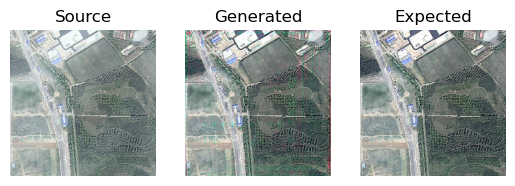

In [29]:
[X1, X2] = load_real_samples('haze_nn.npz')
print('Loaded', X1.shape, X2.shape)
g_model = load_model(finer_model('model_'))

ix = np.random.randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]
gen_image = g_model.predict(src_image)
plot_images(src_image, gen_image, tar_image)

In [30]:
def load_images_test(path, size=(256,256)):
    data_list = list()
    files = os.listdir(path)
    files.sort()
    for filename in files:
        pixels = load_img(path + str(filename), target_size=size)
        pixels = img_to_array(pixels)
        data_list.append(pixels)
    return np.asarray(data_list)

In [31]:
test_inp = load_images_test(PATH + 'test/input/')
test_tar = load_images_test(PATH + 'test/target/')

print(test_inp.shape)
print(test_tar.shape)

filename = 'test.npz'
np.savez_compressed(filename, test_inp, test_tar)
print('Saved dataset: ', filename)

(45, 256, 256, 3)
(45, 256, 256, 3)
Saved dataset:  test.npz


In [32]:
H_test_data, C_test_data = load_real_samples('test.npz')

In [33]:
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

def ssim_evaluation(img1, img2):
    ssim_value = ssim(img1, img2, channel_axis=2, data_range=img2.max() - img2.min())
    ssim_list.append(ssim_value)
    
def psnr_evaluation(img1, img2):
    psnr_value = psnr(img1,img2)
    psnr_list.append(psnr_value)

1/1 [==============================] - 0s 25ms/step


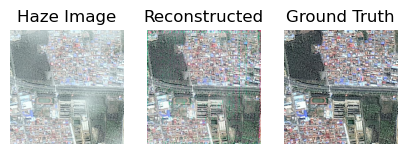

1/1 [==============================] - 0s 28ms/step


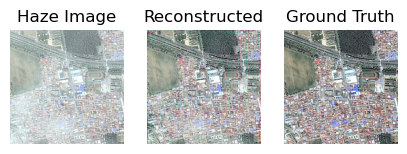

1/1 [==============================] - 0s 24ms/step


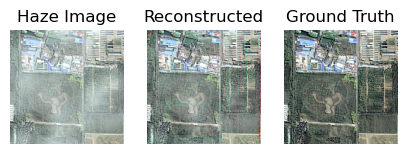

1/1 [==============================] - 0s 23ms/step


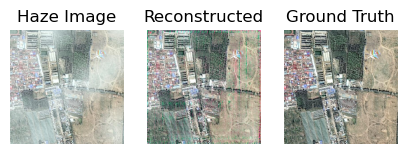

1/1 [==============================] - 0s 27ms/step


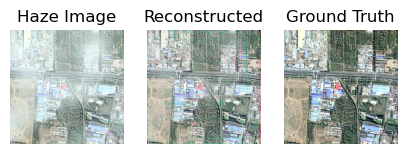

1/1 [==============================] - 0s 22ms/step


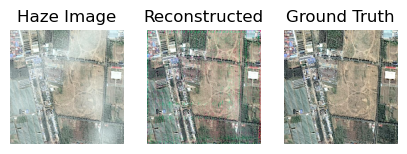

1/1 [==============================] - 0s 23ms/step


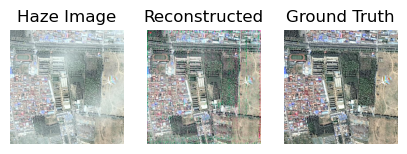

1/1 [==============================] - 0s 23ms/step


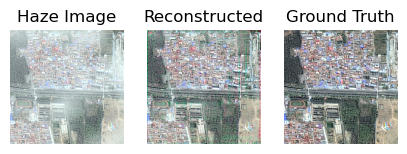

1/1 [==============================] - 0s 23ms/step


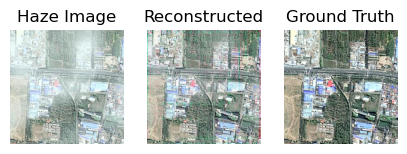

1/1 [==============================] - 0s 23ms/step


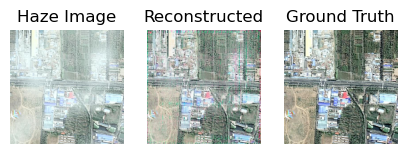

1/1 [==============================] - 0s 28ms/step


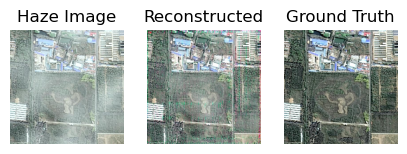

1/1 [==============================] - 0s 23ms/step


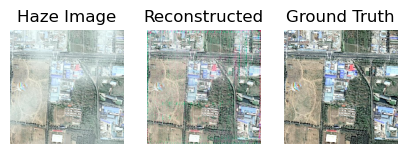

1/1 [==============================] - 0s 24ms/step


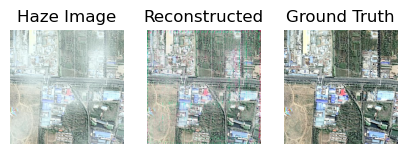

1/1 [==============================] - 0s 44ms/step


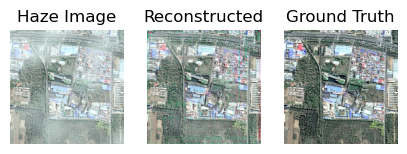

1/1 [==============================] - 0s 24ms/step


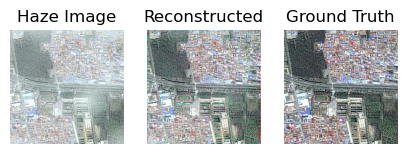

1/1 [==============================] - 0s 24ms/step


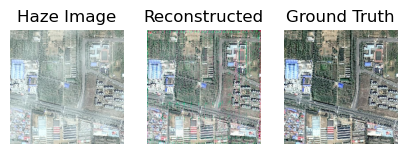

1/1 [==============================] - 0s 23ms/step


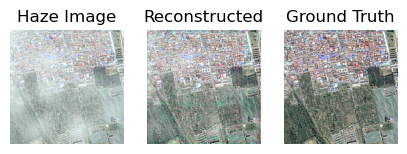

1/1 [==============================] - 0s 25ms/step


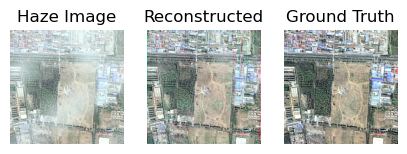

1/1 [==============================] - 0s 23ms/step


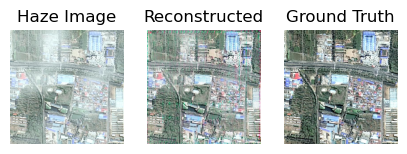

1/1 [==============================] - 0s 23ms/step


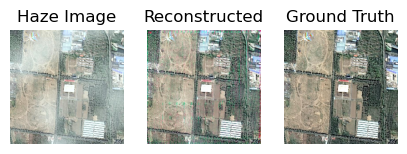

1/1 [==============================] - 0s 23ms/step


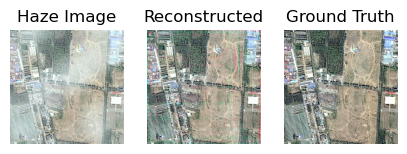

1/1 [==============================] - 0s 25ms/step


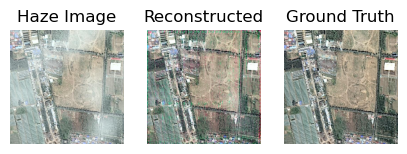

1/1 [==============================] - 0s 24ms/step


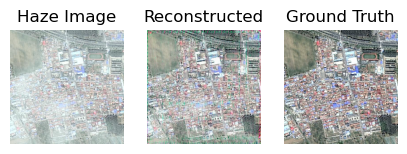

1/1 [==============================] - 0s 23ms/step


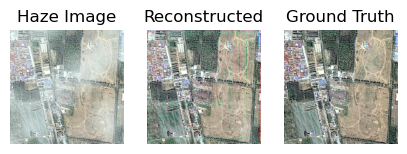

1/1 [==============================] - 0s 26ms/step


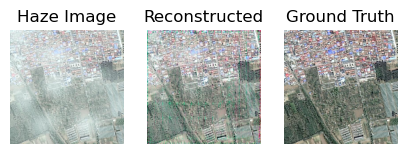

1/1 [==============================] - 0s 23ms/step


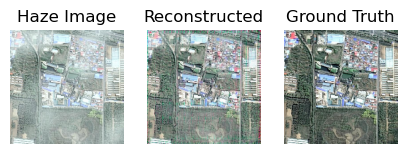

1/1 [==============================] - 0s 29ms/step


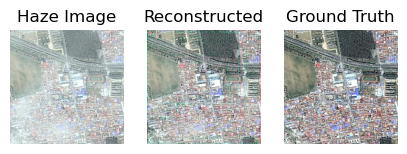

1/1 [==============================] - 0s 30ms/step


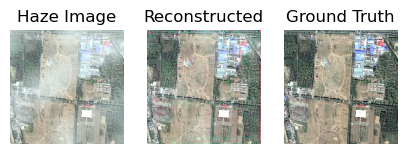

1/1 [==============================] - 0s 35ms/step


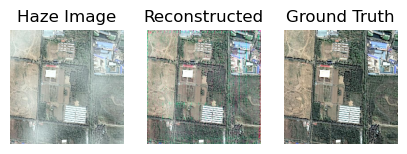

1/1 [==============================] - 0s 30ms/step


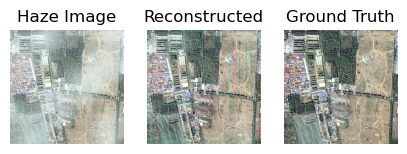

1/1 [==============================] - 0s 33ms/step


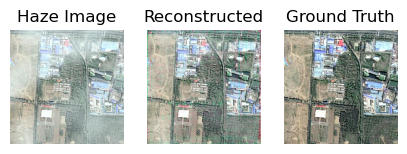

1/1 [==============================] - 0s 29ms/step


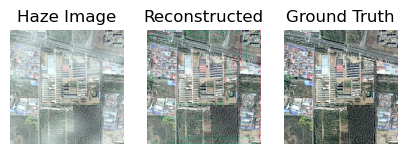

1/1 [==============================] - 0s 33ms/step


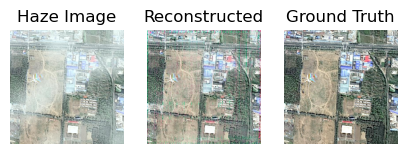

1/1 [==============================] - 0s 30ms/step


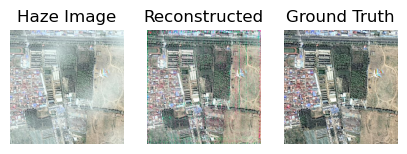

1/1 [==============================] - 0s 30ms/step


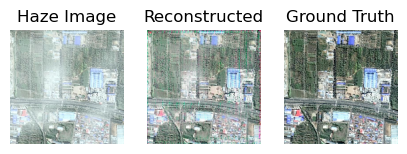

1/1 [==============================] - 0s 31ms/step


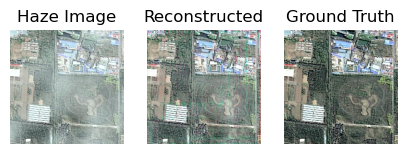

1/1 [==============================] - 0s 30ms/step


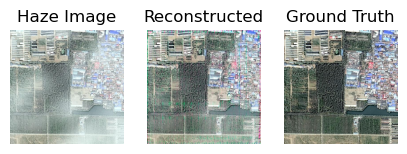

1/1 [==============================] - 0s 30ms/step


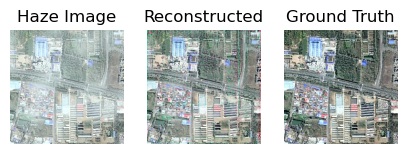

1/1 [==============================] - 0s 30ms/step


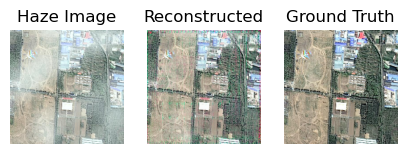

1/1 [==============================] - 0s 32ms/step


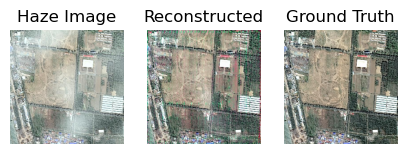

1/1 [==============================] - 0s 30ms/step


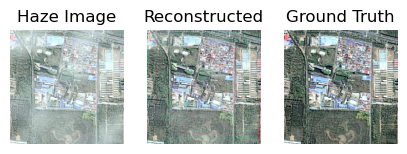

1/1 [==============================] - 0s 30ms/step


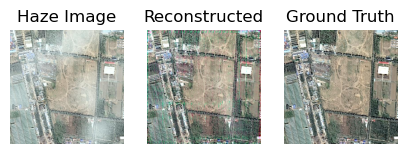

1/1 [==============================] - 0s 30ms/step


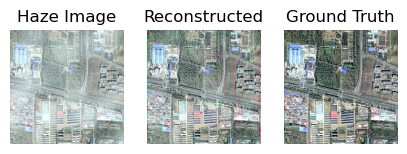

1/1 [==============================] - 0s 32ms/step


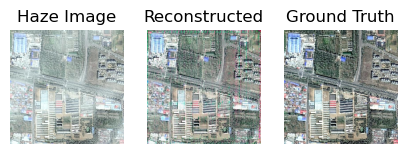

1/1 [==============================] - 0s 29ms/step


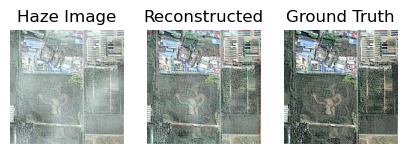

In [34]:
ssim_list = []
psnr_list = []

for i in range(len(H_test_data)): 
    H_test = H_test_data[np.array([i])]
    C_test = C_test_data[np.array([i])]
    
    R_test = g_model.predict(H_test)
    H_test = (H_test + 1) / 2.0
    R_test = (R_test + 1) / 2.0
    C_test = (C_test + 1) / 2.0
    
    ## ssim
    ssim_evaluation(C_test[0], R_test[0])
    
    ## psnr
    psnr_evaluation(C_test[0], R_test[0])
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(5, 10))
    ax1.imshow(H_test[0])
    ax1.set_title('Haze Image')
    ax1.axis('off')

    ax2.imshow(R_test[0])
    ax2.set_title('Reconstructed')
    ax2.axis('off')
    
    ax3.imshow(C_test[0])
    ax3.set_title('Ground Truth')
    ax3.axis('off')

    plt.show()
    plt.close()

In [35]:
import statistics
import pandas as pd

ssim_mean = statistics.mean(ssim_list)
psnr_mean = statistics.mean(psnr_list)

# Create an empty DataFrame
df = pd.DataFrame(columns=['psnr', 'ssim', 'Epoch'])

# Iterate through the lists and populate the DataFrame
for i in range(len(ssim_list)):
    psnr_value = ssim_list[i]
    ssim_value = psnr_list[i]
    epoch_value = i + 1  # Epoch starts from 1
    df = df.append({'psnr': psnr_value, 'ssim': ssim_value, 'Epoch': epoch_value}, ignore_index=True)

# Save the DataFrame to a CSV file
df.to_csv('results_pix2pix.csv', index=False)
output_path = os.path.join('/kaggle/working/', 'results_pix2pix.csv')

print(ssim_mean)
print(psnr_mean)

0.86483645
18.934851879636465
